# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

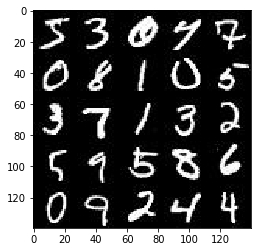

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

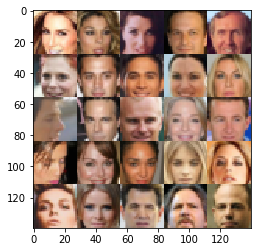

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width,image_height,image_channels))
    inputs_z = tf.placeholder(tf.float32, (None, z_dim))
    learning_rate=tf.placeholder(tf.float32,)
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [11]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope("discriminator",reuse=reuse):
        #input layer 
        x1=tf.layers.conv2d(images,64,5,strides=2,padding="same")
        relu1=tf.maximum(alpha * x1,x1)
        
        x2=tf.layers.conv2d(relu1,128,5,strides=2,padding="same")
        bn2=tf.layers.batch_normalization(x2,training=True)
        relu2=tf.maximum(alpha*bn2,bn2)
        
        x3=tf.layers.conv2d(relu2,256,5,strides=2,padding="same")
        bn3=tf.layers.batch_normalization(x3,training=True)
        relu3=tf.maximum(alpha*bn3,bn3)
        
        flat=tf.reshape(relu3,(-1,4*4*256))
        logits=tf.layers.dense(flat,1)
        out=tf.sigmoid(logits)
        return  out,logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [12]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    need_reuse=False if is_train else True
    with tf.variable_scope("generator",reuse=need_reuse):
        x1=tf.layers.dense(z,7*7*512)
        
        x1=tf.reshape(x1,(-1,7,7,512))
        x1=tf.layers.batch_normalization(x1,training=is_train)
        x1=tf.maximum(alpha*x1,x1)
        
        x2=tf.layers.conv2d_transpose(x1,256,5,strides=2,padding="same")
        x2=tf.layers.batch_normalization(x2,training=is_train)
        x2=tf.maximum(alpha*x2,x2)
        
        x3=tf.layers.conv2d_transpose(x2,128,5,strides=2,padding="same")
        x3=tf.layers.batch_normalization(x3,training=is_train)
        x3=tf.maximum(alpha*x3,x3)
        
    
        logits=tf.layers.conv2d_transpose(x3,out_channel_dim,5,strides=1,padding="same")
        out=tf.tanh(logits)
    

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [13]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model=generator(input_z,out_channel_dim)
    d_model_real,d_logits_real=discriminator(input_real)
    d_model_fake,d_logits_fake=discriminator(g_model,reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=0.9*tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [15]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    samples, losses = [], []
    steps = 0
    show_every = 60
    print_every = 30
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[-1])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, len(data_image_mode), data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/3... Discriminator Loss: 0.9294... Generator Loss: 3.6592
Epoch 1/3... Discriminator Loss: 0.9784... Generator Loss: 1.6321


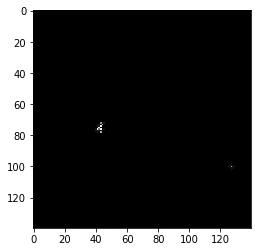

Epoch 1/3... Discriminator Loss: 0.6942... Generator Loss: 1.6993
Epoch 1/3... Discriminator Loss: 0.3971... Generator Loss: 3.5241


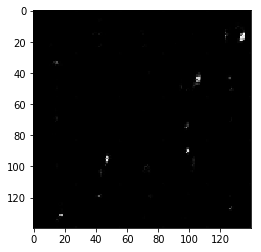

Epoch 1/3... Discriminator Loss: 0.4663... Generator Loss: 2.4509
Epoch 1/3... Discriminator Loss: 0.3362... Generator Loss: 6.3349


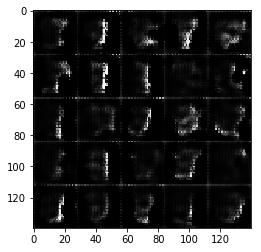

Epoch 1/3... Discriminator Loss: 1.3167... Generator Loss: 0.6774
Epoch 1/3... Discriminator Loss: 1.2168... Generator Loss: 5.4816


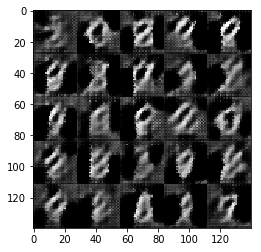

Epoch 1/3... Discriminator Loss: 0.3484... Generator Loss: 5.0638
Epoch 1/3... Discriminator Loss: 0.3514... Generator Loss: 4.4374


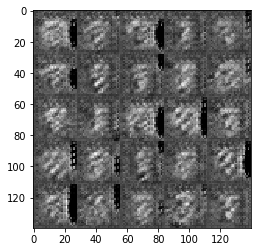

Epoch 1/3... Discriminator Loss: 0.4161... Generator Loss: 3.5618
Epoch 1/3... Discriminator Loss: 0.4276... Generator Loss: 3.9382


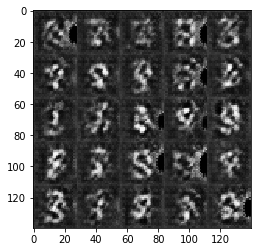

Epoch 1/3... Discriminator Loss: 1.4814... Generator Loss: 1.5460
Epoch 1/3... Discriminator Loss: 1.4004... Generator Loss: 3.2249


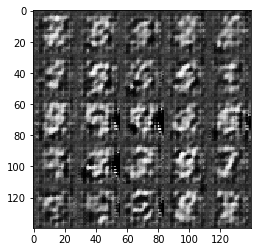

Epoch 1/3... Discriminator Loss: 0.3562... Generator Loss: 6.0137
Epoch 1/3... Discriminator Loss: 0.4741... Generator Loss: 2.6365


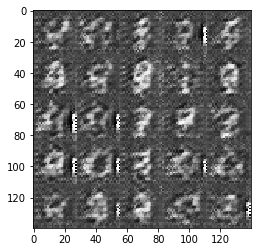

Epoch 1/3... Discriminator Loss: 0.5238... Generator Loss: 3.4503
Epoch 1/3... Discriminator Loss: 0.3682... Generator Loss: 4.2885


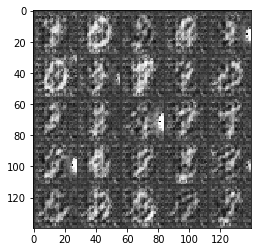

Epoch 1/3... Discriminator Loss: 0.3842... Generator Loss: 6.4119
Epoch 1/3... Discriminator Loss: 0.3338... Generator Loss: 6.3299


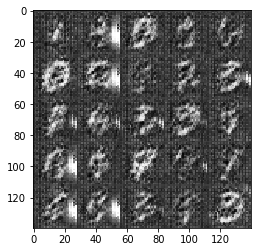

Epoch 1/3... Discriminator Loss: 0.3966... Generator Loss: 4.2336
Epoch 1/3... Discriminator Loss: 1.2162... Generator Loss: 0.9686


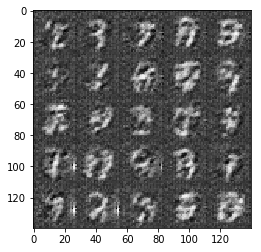

Epoch 1/3... Discriminator Loss: 0.8726... Generator Loss: 1.5560
Epoch 1/3... Discriminator Loss: 0.5580... Generator Loss: 6.8672


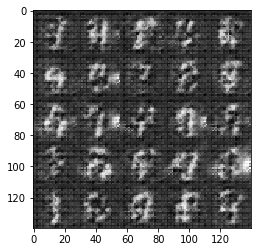

Epoch 1/3... Discriminator Loss: 0.7312... Generator Loss: 1.8218
Epoch 1/3... Discriminator Loss: 1.4880... Generator Loss: 0.4841


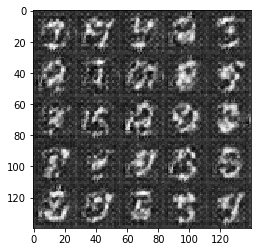

Epoch 1/3... Discriminator Loss: 0.3765... Generator Loss: 3.8450
Epoch 1/3... Discriminator Loss: 0.6427... Generator Loss: 1.6283


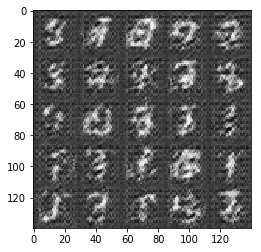

Epoch 1/3... Discriminator Loss: 0.8367... Generator Loss: 2.0251
Epoch 1/3... Discriminator Loss: 0.5055... Generator Loss: 2.1630


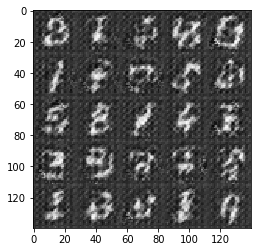

Epoch 1/3... Discriminator Loss: 0.5048... Generator Loss: 2.1329
Epoch 2/3... Discriminator Loss: 0.8429... Generator Loss: 1.2630


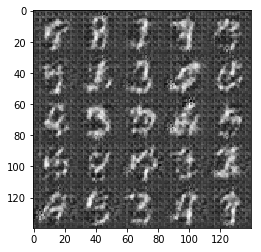

Epoch 2/3... Discriminator Loss: 0.5051... Generator Loss: 3.2541
Epoch 2/3... Discriminator Loss: 0.3737... Generator Loss: 3.7624


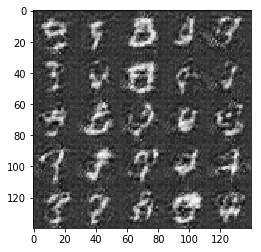

Epoch 2/3... Discriminator Loss: 0.4776... Generator Loss: 3.7478
Epoch 2/3... Discriminator Loss: 0.3541... Generator Loss: 4.8231


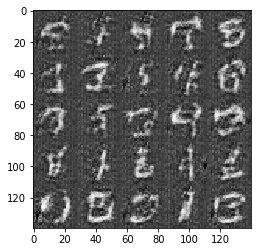

Epoch 2/3... Discriminator Loss: 1.0220... Generator Loss: 1.2153
Epoch 2/3... Discriminator Loss: 3.3090... Generator Loss: 0.1154


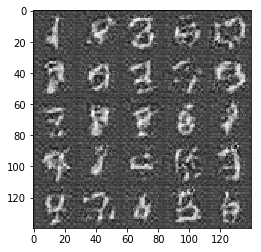

Epoch 2/3... Discriminator Loss: 0.6782... Generator Loss: 2.1136
Epoch 2/3... Discriminator Loss: 0.8491... Generator Loss: 1.5196


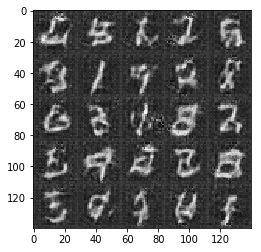

Epoch 2/3... Discriminator Loss: 0.7543... Generator Loss: 2.3899
Epoch 2/3... Discriminator Loss: 0.4150... Generator Loss: 4.5182


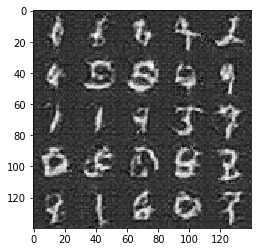

Epoch 2/3... Discriminator Loss: 0.3723... Generator Loss: 3.7681
Epoch 2/3... Discriminator Loss: 0.6072... Generator Loss: 1.6411


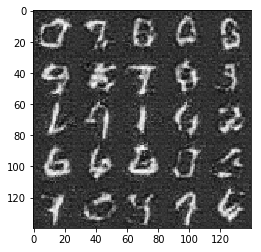

Epoch 2/3... Discriminator Loss: 1.0428... Generator Loss: 3.9601
Epoch 2/3... Discriminator Loss: 0.5430... Generator Loss: 2.2154


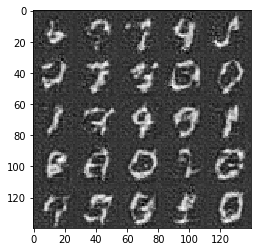

Epoch 2/3... Discriminator Loss: 0.5759... Generator Loss: 1.9518
Epoch 2/3... Discriminator Loss: 0.7245... Generator Loss: 1.3679


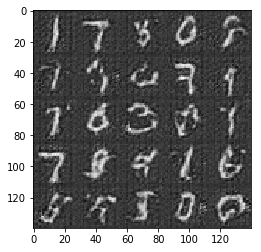

Epoch 2/3... Discriminator Loss: 0.5293... Generator Loss: 2.3603
Epoch 2/3... Discriminator Loss: 0.5989... Generator Loss: 1.9982


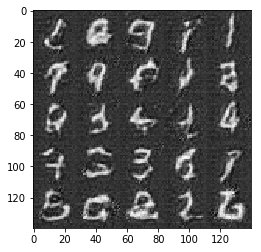

Epoch 2/3... Discriminator Loss: 0.3974... Generator Loss: 3.5617
Epoch 2/3... Discriminator Loss: 0.3534... Generator Loss: 4.5799


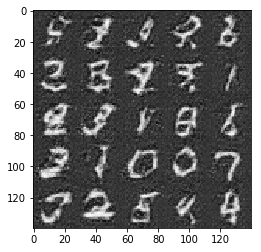

Epoch 2/3... Discriminator Loss: 0.3619... Generator Loss: 4.8106
Epoch 2/3... Discriminator Loss: 0.8271... Generator Loss: 1.0719


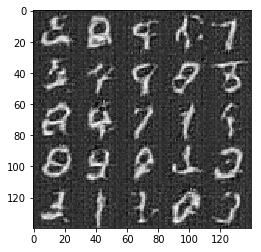

Epoch 2/3... Discriminator Loss: 0.3966... Generator Loss: 4.7616
Epoch 2/3... Discriminator Loss: 1.0176... Generator Loss: 1.0529


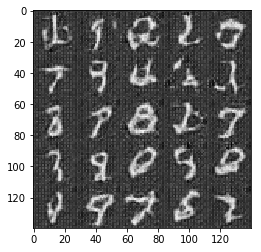

Epoch 2/3... Discriminator Loss: 0.8720... Generator Loss: 1.1474
Epoch 2/3... Discriminator Loss: 0.7721... Generator Loss: 2.6672


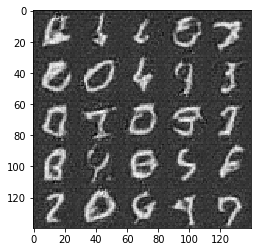

Epoch 2/3... Discriminator Loss: 0.3671... Generator Loss: 3.9939
Epoch 2/3... Discriminator Loss: 0.7343... Generator Loss: 1.3888


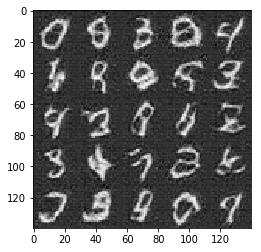

Epoch 2/3... Discriminator Loss: 0.3874... Generator Loss: 5.5991
Epoch 2/3... Discriminator Loss: 0.3481... Generator Loss: 4.9789


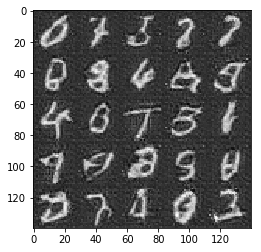

Epoch 3/3... Discriminator Loss: 0.3945... Generator Loss: 3.0674
Epoch 3/3... Discriminator Loss: 0.3912... Generator Loss: 3.1039


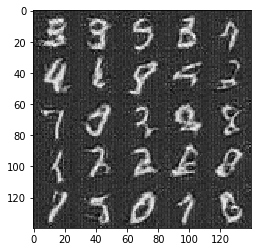

Epoch 3/3... Discriminator Loss: 0.5048... Generator Loss: 3.3472
Epoch 3/3... Discriminator Loss: 1.1524... Generator Loss: 2.9590


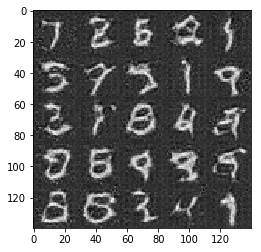

Epoch 3/3... Discriminator Loss: 0.7998... Generator Loss: 1.1954
Epoch 3/3... Discriminator Loss: 1.0700... Generator Loss: 0.8346


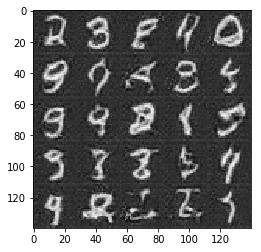

Epoch 3/3... Discriminator Loss: 0.3501... Generator Loss: 4.6075
Epoch 3/3... Discriminator Loss: 0.7621... Generator Loss: 1.2798


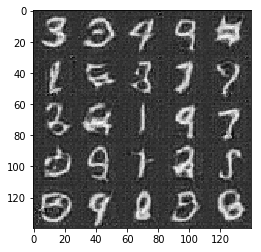

Epoch 3/3... Discriminator Loss: 0.8685... Generator Loss: 1.3099
Epoch 3/3... Discriminator Loss: 0.3981... Generator Loss: 3.1997


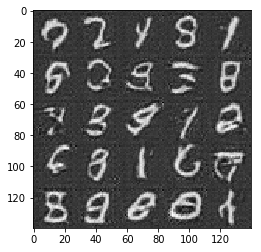

Epoch 3/3... Discriminator Loss: 0.4694... Generator Loss: 2.2815
Epoch 3/3... Discriminator Loss: 2.7759... Generator Loss: 5.9334


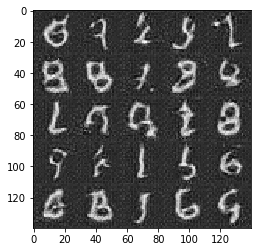

Epoch 3/3... Discriminator Loss: 0.4141... Generator Loss: 3.0521
Epoch 3/3... Discriminator Loss: 0.9810... Generator Loss: 1.0454


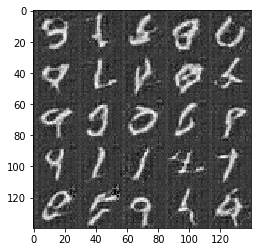

Epoch 3/3... Discriminator Loss: 0.5843... Generator Loss: 1.8230
Epoch 3/3... Discriminator Loss: 1.5101... Generator Loss: 0.7513


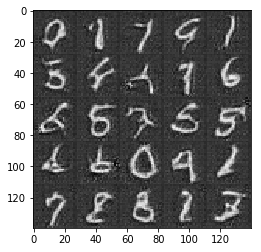

Epoch 3/3... Discriminator Loss: 0.7221... Generator Loss: 1.4130
Epoch 3/3... Discriminator Loss: 0.6529... Generator Loss: 1.8149


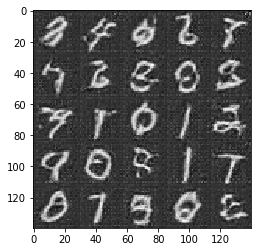

Epoch 3/3... Discriminator Loss: 0.8023... Generator Loss: 1.3222
Epoch 3/3... Discriminator Loss: 0.4402... Generator Loss: 2.5352


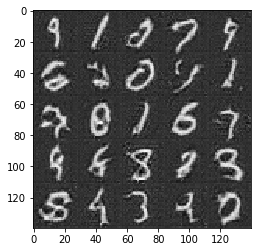

Epoch 3/3... Discriminator Loss: 0.3877... Generator Loss: 3.2720
Epoch 3/3... Discriminator Loss: 0.4986... Generator Loss: 2.3791


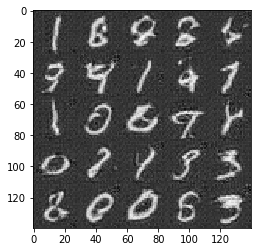

Epoch 3/3... Discriminator Loss: 0.5133... Generator Loss: 2.6651
Epoch 3/3... Discriminator Loss: 0.6269... Generator Loss: 1.6858


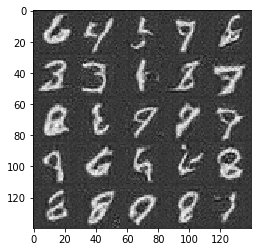

Epoch 3/3... Discriminator Loss: 0.5949... Generator Loss: 2.0568
Epoch 3/3... Discriminator Loss: 0.3914... Generator Loss: 4.7745


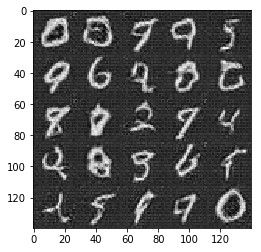

Epoch 3/3... Discriminator Loss: 0.3475... Generator Loss: 5.7548
Epoch 3/3... Discriminator Loss: 1.1783... Generator Loss: 2.6530


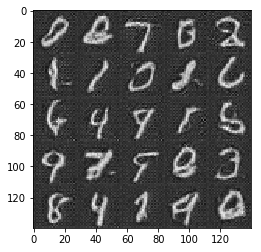

Epoch 3/3... Discriminator Loss: 0.7020... Generator Loss: 1.9571
Epoch 3/3... Discriminator Loss: 2.5259... Generator Loss: 3.8704


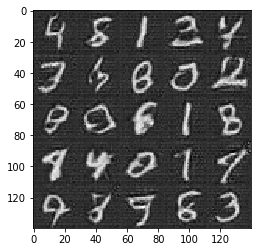

Epoch 3/3... Discriminator Loss: 0.9778... Generator Loss: 0.9367


In [19]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/4... Discriminator Loss: 1.5994... Generator Loss: 0.8169
Epoch 1/4... Discriminator Loss: 0.4376... Generator Loss: 3.4455


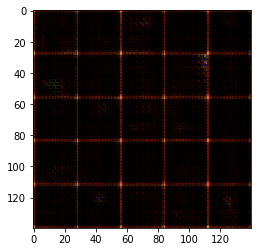

Epoch 1/4... Discriminator Loss: 0.4139... Generator Loss: 3.0032
Epoch 1/4... Discriminator Loss: 0.9655... Generator Loss: 1.0100


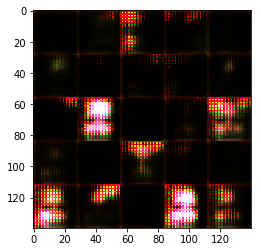

Epoch 1/4... Discriminator Loss: 0.3617... Generator Loss: 4.2214
Epoch 1/4... Discriminator Loss: 0.5606... Generator Loss: 3.5347


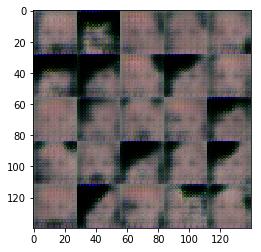

Epoch 1/4... Discriminator Loss: 0.4252... Generator Loss: 3.9034
Epoch 1/4... Discriminator Loss: 0.4068... Generator Loss: 3.0283


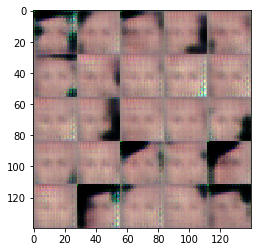

Epoch 1/4... Discriminator Loss: 0.3768... Generator Loss: 3.6413
Epoch 1/4... Discriminator Loss: 0.6326... Generator Loss: 1.5759


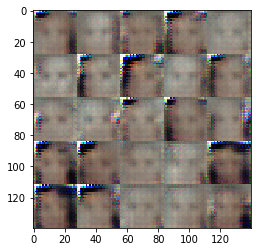

Epoch 1/4... Discriminator Loss: 0.4384... Generator Loss: 3.9761
Epoch 1/4... Discriminator Loss: 0.5691... Generator Loss: 2.3376


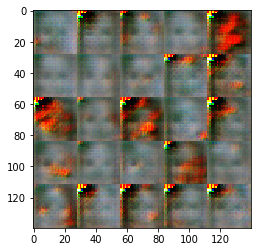

Epoch 1/4... Discriminator Loss: 0.6531... Generator Loss: 1.8502
Epoch 1/4... Discriminator Loss: 0.4431... Generator Loss: 3.9054


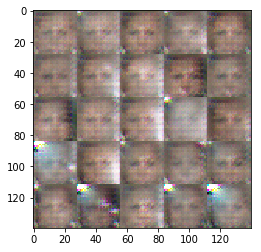

Epoch 1/4... Discriminator Loss: 2.2933... Generator Loss: 5.3509
Epoch 1/4... Discriminator Loss: 0.5053... Generator Loss: 4.5450


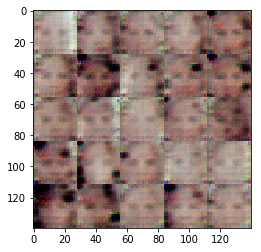

Epoch 1/4... Discriminator Loss: 0.3839... Generator Loss: 3.6406
Epoch 1/4... Discriminator Loss: 0.3388... Generator Loss: 6.3728


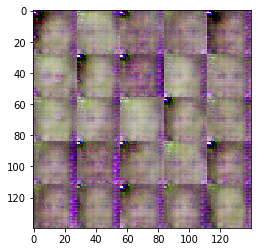

Epoch 1/4... Discriminator Loss: 1.6109... Generator Loss: 0.3960
Epoch 1/4... Discriminator Loss: 0.4252... Generator Loss: 3.7311


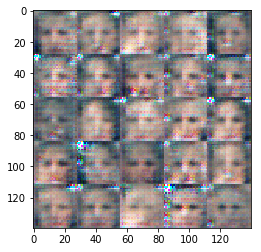

Epoch 1/4... Discriminator Loss: 0.5423... Generator Loss: 2.2797
Epoch 1/4... Discriminator Loss: 0.3653... Generator Loss: 4.0757


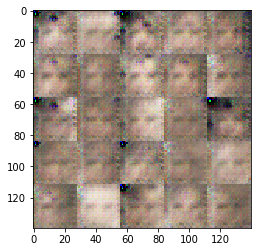

Epoch 1/4... Discriminator Loss: 0.5285... Generator Loss: 2.5934
Epoch 1/4... Discriminator Loss: 0.4357... Generator Loss: 3.1192


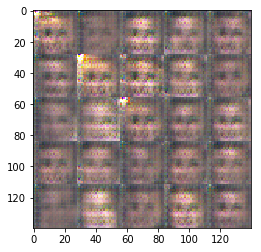

Epoch 1/4... Discriminator Loss: 0.3874... Generator Loss: 3.8813
Epoch 1/4... Discriminator Loss: 0.6203... Generator Loss: 1.7582


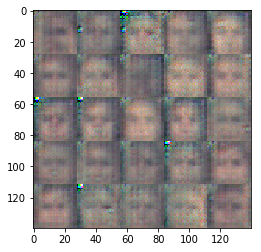

Epoch 1/4... Discriminator Loss: 0.3863... Generator Loss: 3.9251
Epoch 1/4... Discriminator Loss: 0.3459... Generator Loss: 4.8010


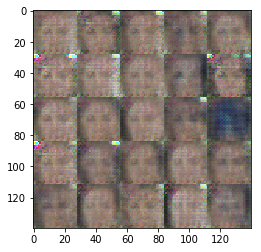

Epoch 1/4... Discriminator Loss: 0.4491... Generator Loss: 2.5528
Epoch 1/4... Discriminator Loss: 0.3493... Generator Loss: 4.7749


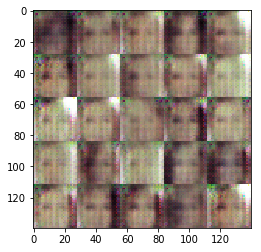

Epoch 1/4... Discriminator Loss: 0.9645... Generator Loss: 1.1617
Epoch 1/4... Discriminator Loss: 0.9796... Generator Loss: 1.0390


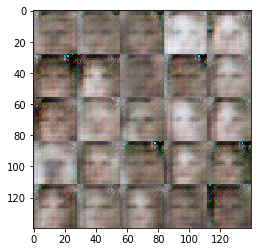

Epoch 1/4... Discriminator Loss: 1.6517... Generator Loss: 0.4527
Epoch 1/4... Discriminator Loss: 4.9261... Generator Loss: 0.0314


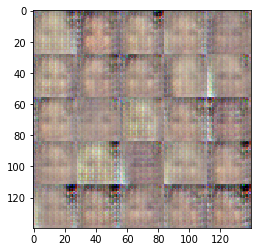

Epoch 1/4... Discriminator Loss: 0.9253... Generator Loss: 1.0561
Epoch 1/4... Discriminator Loss: 1.3412... Generator Loss: 0.6717


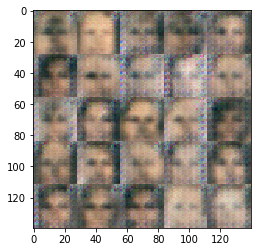

Epoch 1/4... Discriminator Loss: 1.1861... Generator Loss: 0.8111
Epoch 1/4... Discriminator Loss: 1.5137... Generator Loss: 1.4581


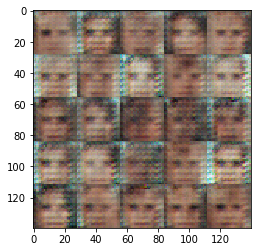

Epoch 1/4... Discriminator Loss: 1.5642... Generator Loss: 0.5776
Epoch 1/4... Discriminator Loss: 1.6155... Generator Loss: 0.6360


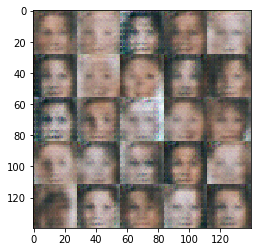

Epoch 1/4... Discriminator Loss: 1.4539... Generator Loss: 0.8231
Epoch 1/4... Discriminator Loss: 1.3802... Generator Loss: 0.7820


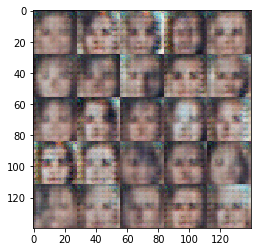

Epoch 1/4... Discriminator Loss: 1.5249... Generator Loss: 1.6526
Epoch 1/4... Discriminator Loss: 1.1059... Generator Loss: 1.1383


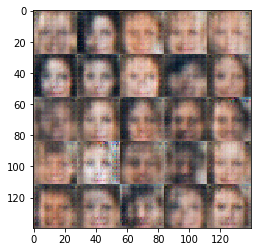

Epoch 1/4... Discriminator Loss: 1.3036... Generator Loss: 0.9187
Epoch 1/4... Discriminator Loss: 1.8317... Generator Loss: 0.9435


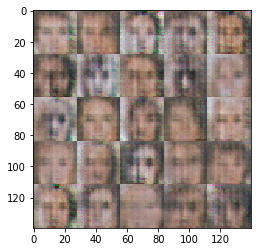

Epoch 1/4... Discriminator Loss: 1.0963... Generator Loss: 1.0965
Epoch 1/4... Discriminator Loss: 1.2156... Generator Loss: 0.9416


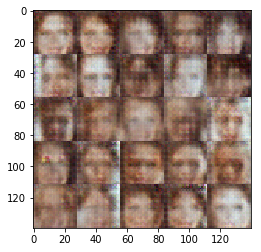

Epoch 1/4... Discriminator Loss: 1.3739... Generator Loss: 0.7170
Epoch 1/4... Discriminator Loss: 1.2892... Generator Loss: 1.1071


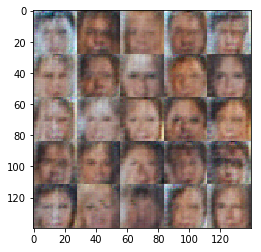

Epoch 1/4... Discriminator Loss: 1.3462... Generator Loss: 0.9360
Epoch 1/4... Discriminator Loss: 1.4198... Generator Loss: 1.4922


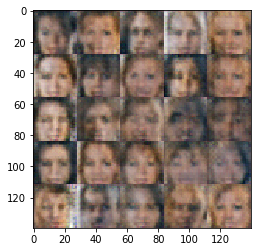

Epoch 1/4... Discriminator Loss: 1.3461... Generator Loss: 0.6163
Epoch 1/4... Discriminator Loss: 1.6900... Generator Loss: 1.3953


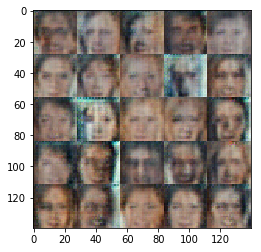

Epoch 1/4... Discriminator Loss: 1.1577... Generator Loss: 1.1643
Epoch 1/4... Discriminator Loss: 1.5697... Generator Loss: 0.5924


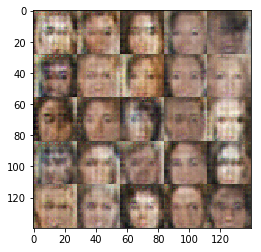

Epoch 1/4... Discriminator Loss: 1.2946... Generator Loss: 1.1657
Epoch 1/4... Discriminator Loss: 1.4220... Generator Loss: 0.7368


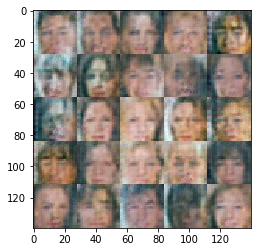

Epoch 1/4... Discriminator Loss: 1.3123... Generator Loss: 0.9217
Epoch 1/4... Discriminator Loss: 1.1951... Generator Loss: 1.0312


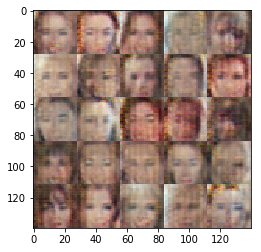

Epoch 1/4... Discriminator Loss: 1.2625... Generator Loss: 0.7730
Epoch 1/4... Discriminator Loss: 1.2051... Generator Loss: 1.3556


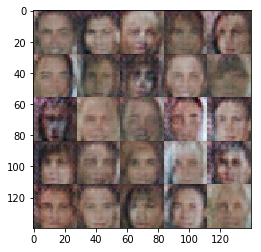

Epoch 1/4... Discriminator Loss: 1.3874... Generator Loss: 0.6522
Epoch 1/4... Discriminator Loss: 1.5697... Generator Loss: 0.4585


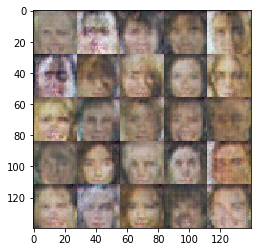

Epoch 1/4... Discriminator Loss: 1.3640... Generator Loss: 0.6141
Epoch 1/4... Discriminator Loss: 1.5566... Generator Loss: 1.4507


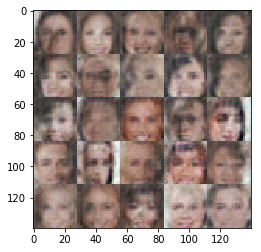

Epoch 1/4... Discriminator Loss: 1.1655... Generator Loss: 0.8101
Epoch 1/4... Discriminator Loss: 1.2997... Generator Loss: 1.0857


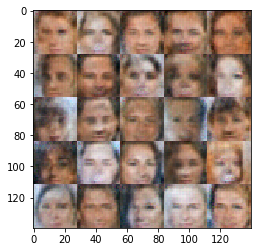

Epoch 1/4... Discriminator Loss: 1.4738... Generator Loss: 0.6788
Epoch 1/4... Discriminator Loss: 1.4897... Generator Loss: 0.5112


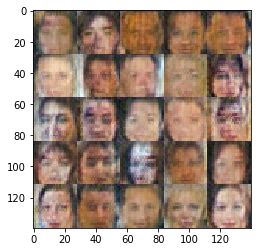

Epoch 1/4... Discriminator Loss: 1.2438... Generator Loss: 0.7658
Epoch 1/4... Discriminator Loss: 1.1613... Generator Loss: 1.1711


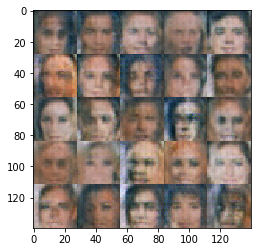

Epoch 1/4... Discriminator Loss: 1.3181... Generator Loss: 0.5855
Epoch 1/4... Discriminator Loss: 1.3793... Generator Loss: 0.9653


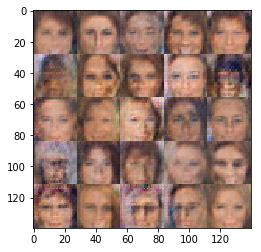

Epoch 1/4... Discriminator Loss: 1.2108... Generator Loss: 0.8094
Epoch 1/4... Discriminator Loss: 1.1558... Generator Loss: 1.0335


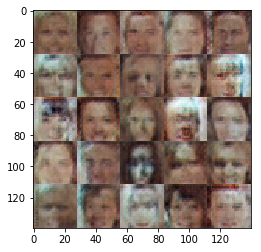

Epoch 1/4... Discriminator Loss: 1.2503... Generator Loss: 1.0465
Epoch 1/4... Discriminator Loss: 1.4157... Generator Loss: 0.8277


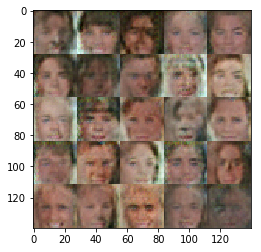

Epoch 1/4... Discriminator Loss: 1.1858... Generator Loss: 1.5134
Epoch 1/4... Discriminator Loss: 1.1760... Generator Loss: 1.1809


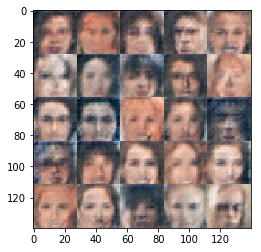

Epoch 1/4... Discriminator Loss: 1.2322... Generator Loss: 0.6944
Epoch 1/4... Discriminator Loss: 1.2949... Generator Loss: 0.7240


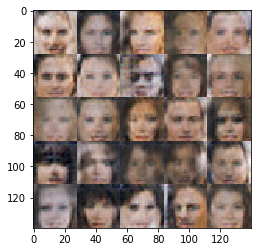

Epoch 1/4... Discriminator Loss: 1.3807... Generator Loss: 0.8664
Epoch 1/4... Discriminator Loss: 1.4717... Generator Loss: 0.9609


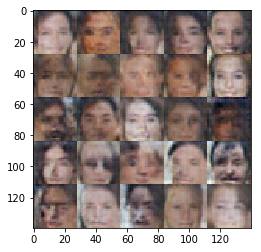

Epoch 1/4... Discriminator Loss: 1.3993... Generator Loss: 0.5755
Epoch 1/4... Discriminator Loss: 1.6128... Generator Loss: 0.4138


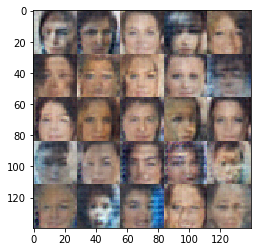

Epoch 1/4... Discriminator Loss: 1.6289... Generator Loss: 0.5829
Epoch 1/4... Discriminator Loss: 1.3304... Generator Loss: 0.7016


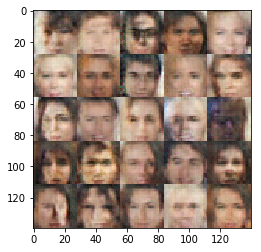

Epoch 1/4... Discriminator Loss: 1.3999... Generator Loss: 1.0463
Epoch 1/4... Discriminator Loss: 1.1788... Generator Loss: 0.8775


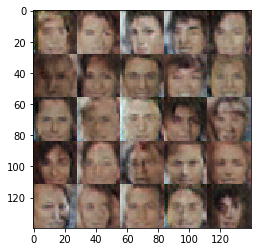

Epoch 1/4... Discriminator Loss: 1.3928... Generator Loss: 0.5386
Epoch 1/4... Discriminator Loss: 1.3254... Generator Loss: 0.9813


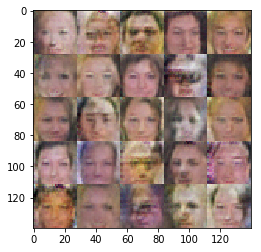

Epoch 1/4... Discriminator Loss: 1.2733... Generator Loss: 0.7792
Epoch 1/4... Discriminator Loss: 1.3415... Generator Loss: 0.9816


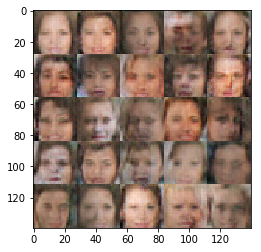

Epoch 1/4... Discriminator Loss: 1.4501... Generator Loss: 0.6423
Epoch 1/4... Discriminator Loss: 1.3537... Generator Loss: 0.6727


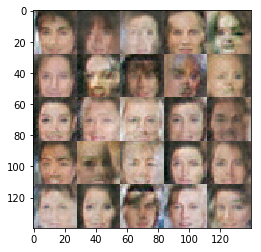

Epoch 1/4... Discriminator Loss: 1.1637... Generator Loss: 0.8479
Epoch 1/4... Discriminator Loss: 1.3523... Generator Loss: 0.7383


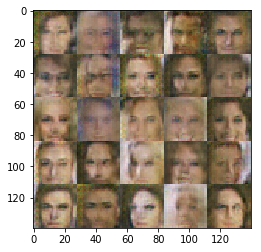

Epoch 2/4... Discriminator Loss: 1.1307... Generator Loss: 1.0631
Epoch 2/4... Discriminator Loss: 1.5635... Generator Loss: 0.6746


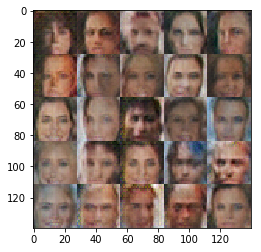

Epoch 2/4... Discriminator Loss: 1.1191... Generator Loss: 1.2092
Epoch 2/4... Discriminator Loss: 1.4460... Generator Loss: 0.5995


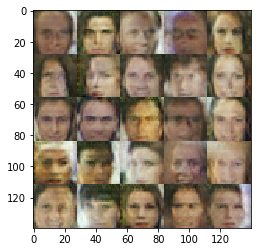

Epoch 2/4... Discriminator Loss: 1.4808... Generator Loss: 0.5513
Epoch 2/4... Discriminator Loss: 1.5151... Generator Loss: 0.6751


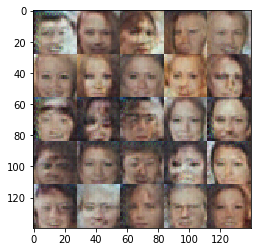

Epoch 2/4... Discriminator Loss: 1.1832... Generator Loss: 0.6807
Epoch 2/4... Discriminator Loss: 1.2819... Generator Loss: 0.7265


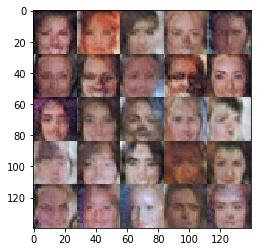

Epoch 2/4... Discriminator Loss: 1.2955... Generator Loss: 0.8033
Epoch 2/4... Discriminator Loss: 1.4441... Generator Loss: 0.6369


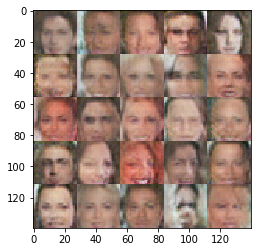

Epoch 2/4... Discriminator Loss: 1.4144... Generator Loss: 0.7927
Epoch 2/4... Discriminator Loss: 1.2941... Generator Loss: 0.8450


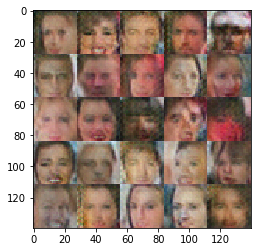

Epoch 2/4... Discriminator Loss: 1.2077... Generator Loss: 0.8729
Epoch 2/4... Discriminator Loss: 1.3776... Generator Loss: 0.7548


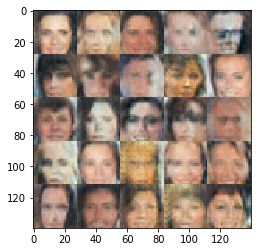

Epoch 2/4... Discriminator Loss: 1.4984... Generator Loss: 0.5192
Epoch 2/4... Discriminator Loss: 1.3545... Generator Loss: 0.6316


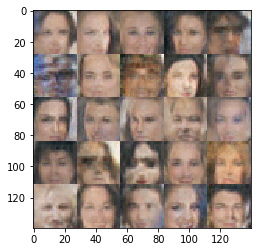

Epoch 2/4... Discriminator Loss: 1.3540... Generator Loss: 0.6641
Epoch 2/4... Discriminator Loss: 1.2489... Generator Loss: 0.9416


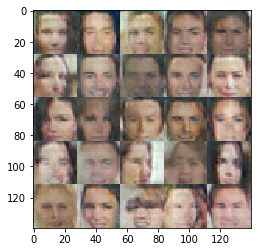

Epoch 2/4... Discriminator Loss: 1.4574... Generator Loss: 0.6020
Epoch 2/4... Discriminator Loss: 1.4196... Generator Loss: 0.6584


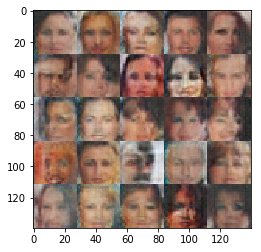

Epoch 2/4... Discriminator Loss: 1.4929... Generator Loss: 0.5788
Epoch 2/4... Discriminator Loss: 1.3323... Generator Loss: 0.7341


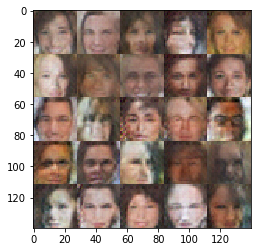

Epoch 2/4... Discriminator Loss: 1.3741... Generator Loss: 0.9676
Epoch 2/4... Discriminator Loss: 1.3012... Generator Loss: 0.6918


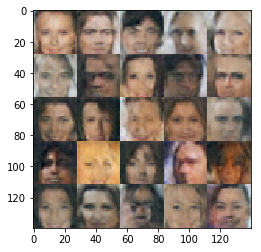

Epoch 2/4... Discriminator Loss: 1.2660... Generator Loss: 0.7104
Epoch 2/4... Discriminator Loss: 1.4143... Generator Loss: 0.5885


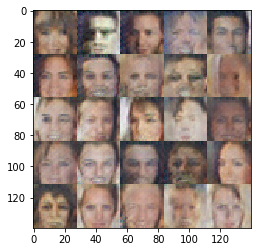

Epoch 2/4... Discriminator Loss: 1.4517... Generator Loss: 0.6413
Epoch 2/4... Discriminator Loss: 1.3107... Generator Loss: 0.9381


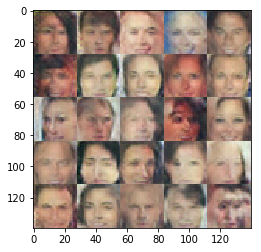

Epoch 2/4... Discriminator Loss: 1.0908... Generator Loss: 1.1133
Epoch 2/4... Discriminator Loss: 1.4020... Generator Loss: 0.6935


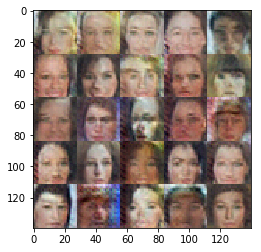

Epoch 2/4... Discriminator Loss: 1.3648... Generator Loss: 0.7087
Epoch 2/4... Discriminator Loss: 1.3623... Generator Loss: 0.6645


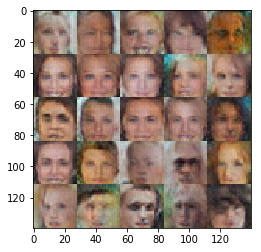

Epoch 2/4... Discriminator Loss: 1.3137... Generator Loss: 0.7256
Epoch 2/4... Discriminator Loss: 1.6558... Generator Loss: 0.4575


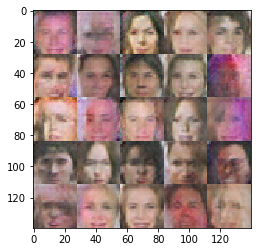

Epoch 2/4... Discriminator Loss: 1.2940... Generator Loss: 0.9859
Epoch 2/4... Discriminator Loss: 1.2450... Generator Loss: 0.8476


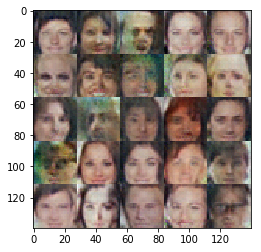

Epoch 2/4... Discriminator Loss: 1.3936... Generator Loss: 0.6625
Epoch 2/4... Discriminator Loss: 1.4647... Generator Loss: 0.5031


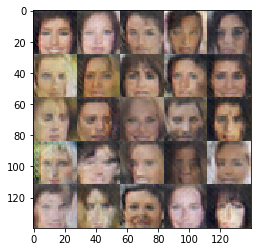

Epoch 2/4... Discriminator Loss: 1.1666... Generator Loss: 0.9043
Epoch 2/4... Discriminator Loss: 1.4087... Generator Loss: 0.5613


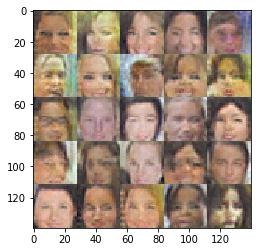

Epoch 2/4... Discriminator Loss: 1.3747... Generator Loss: 0.6411
Epoch 2/4... Discriminator Loss: 1.2975... Generator Loss: 0.7049


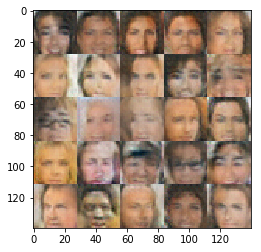

Epoch 2/4... Discriminator Loss: 1.3124... Generator Loss: 0.9269
Epoch 2/4... Discriminator Loss: 1.5648... Generator Loss: 0.7113


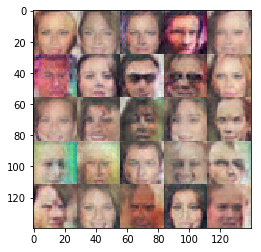

Epoch 2/4... Discriminator Loss: 1.3549... Generator Loss: 0.6541
Epoch 2/4... Discriminator Loss: 1.4935... Generator Loss: 0.6684


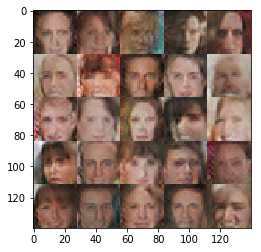

Epoch 2/4... Discriminator Loss: 1.2338... Generator Loss: 0.8510
Epoch 2/4... Discriminator Loss: 1.3396... Generator Loss: 0.8476


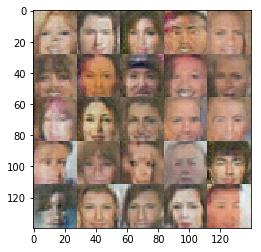

Epoch 2/4... Discriminator Loss: 1.4282... Generator Loss: 0.6224
Epoch 2/4... Discriminator Loss: 1.2983... Generator Loss: 0.9684


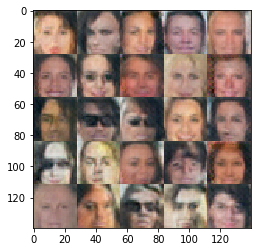

Epoch 2/4... Discriminator Loss: 1.4022... Generator Loss: 0.5757
Epoch 2/4... Discriminator Loss: 1.4476... Generator Loss: 0.5602


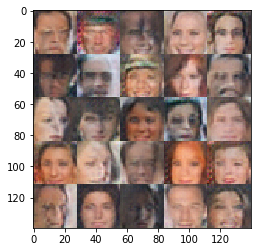

Epoch 2/4... Discriminator Loss: 1.3056... Generator Loss: 0.7764
Epoch 2/4... Discriminator Loss: 1.2880... Generator Loss: 0.8425


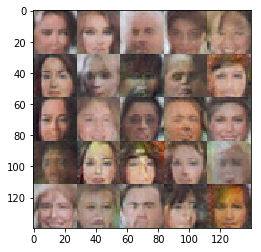

Epoch 2/4... Discriminator Loss: 1.3637... Generator Loss: 0.7227
Epoch 2/4... Discriminator Loss: 1.3977... Generator Loss: 0.5984


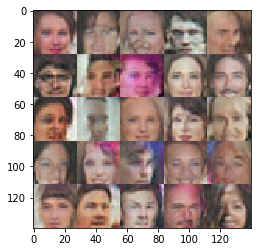

Epoch 2/4... Discriminator Loss: 1.3529... Generator Loss: 0.7062
Epoch 2/4... Discriminator Loss: 1.3071... Generator Loss: 0.7313


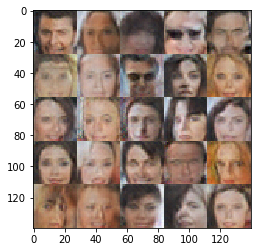

Epoch 2/4... Discriminator Loss: 1.3484... Generator Loss: 0.7306
Epoch 2/4... Discriminator Loss: 1.4267... Generator Loss: 0.7665


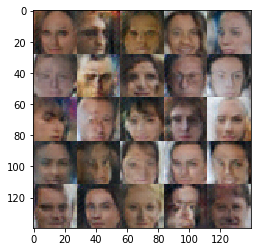

Epoch 2/4... Discriminator Loss: 1.4738... Generator Loss: 0.7175
Epoch 2/4... Discriminator Loss: 1.4635... Generator Loss: 0.8419


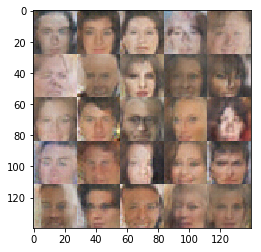

Epoch 2/4... Discriminator Loss: 1.3812... Generator Loss: 0.6798
Epoch 2/4... Discriminator Loss: 1.2094... Generator Loss: 0.8762


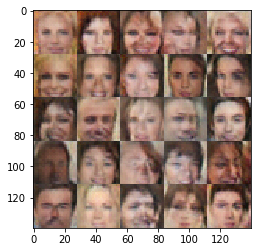

Epoch 2/4... Discriminator Loss: 1.3712... Generator Loss: 0.8186
Epoch 2/4... Discriminator Loss: 1.3371... Generator Loss: 0.7978


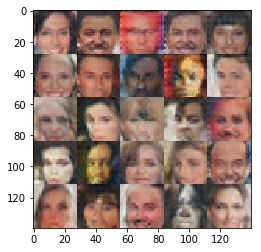

Epoch 2/4... Discriminator Loss: 1.3169... Generator Loss: 0.7637
Epoch 2/4... Discriminator Loss: 1.4087... Generator Loss: 0.7728


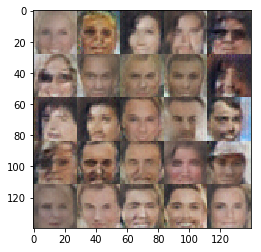

Epoch 2/4... Discriminator Loss: 1.2955... Generator Loss: 0.7539
Epoch 2/4... Discriminator Loss: 1.3141... Generator Loss: 0.7866


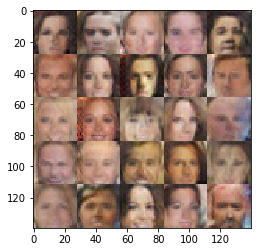

Epoch 2/4... Discriminator Loss: 1.4153... Generator Loss: 0.7592
Epoch 2/4... Discriminator Loss: 1.3434... Generator Loss: 0.8149


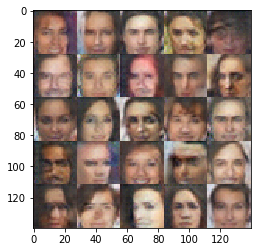

Epoch 2/4... Discriminator Loss: 1.2496... Generator Loss: 0.8821
Epoch 2/4... Discriminator Loss: 1.4931... Generator Loss: 0.7702


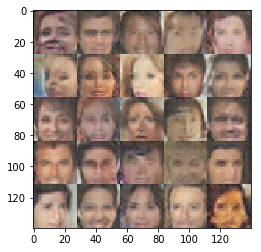

Epoch 2/4... Discriminator Loss: 1.3002... Generator Loss: 0.8772
Epoch 2/4... Discriminator Loss: 1.2563... Generator Loss: 0.9141


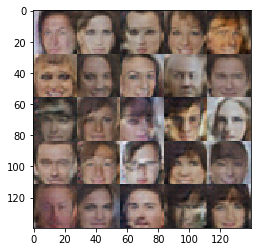

Epoch 2/4... Discriminator Loss: 1.3408... Generator Loss: 0.7396
Epoch 2/4... Discriminator Loss: 1.2493... Generator Loss: 0.7608


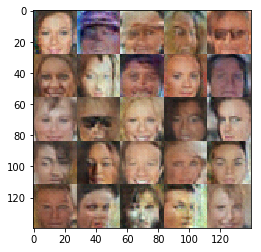

Epoch 2/4... Discriminator Loss: 1.3167... Generator Loss: 0.7497
Epoch 2/4... Discriminator Loss: 1.4102... Generator Loss: 0.7394


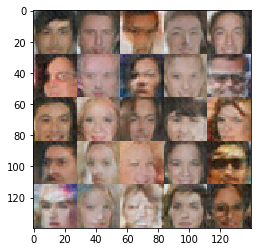

Epoch 2/4... Discriminator Loss: 1.4217... Generator Loss: 0.6643
Epoch 2/4... Discriminator Loss: 1.2454... Generator Loss: 0.7582


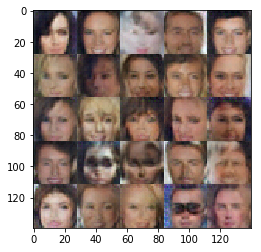

Epoch 2/4... Discriminator Loss: 1.4523... Generator Loss: 0.5844
Epoch 2/4... Discriminator Loss: 1.4079... Generator Loss: 0.7575


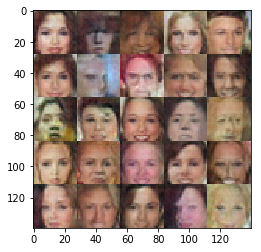

Epoch 2/4... Discriminator Loss: 1.3626... Generator Loss: 0.7728
Epoch 2/4... Discriminator Loss: 1.3097... Generator Loss: 0.9649


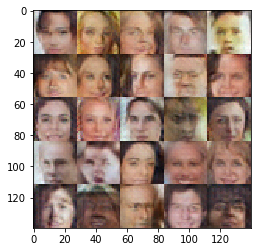

Epoch 2/4... Discriminator Loss: 1.3134... Generator Loss: 0.6810
Epoch 2/4... Discriminator Loss: 1.4431... Generator Loss: 0.7564


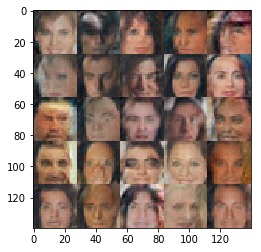

Epoch 2/4... Discriminator Loss: 1.4008... Generator Loss: 0.7132
Epoch 2/4... Discriminator Loss: 1.4003... Generator Loss: 0.7189


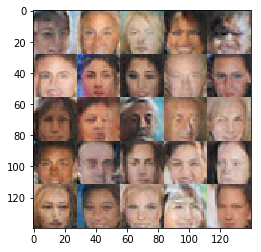

Epoch 2/4... Discriminator Loss: 1.3789... Generator Loss: 0.7722
Epoch 2/4... Discriminator Loss: 1.4558... Generator Loss: 0.6444


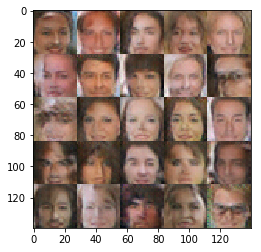

Epoch 2/4... Discriminator Loss: 1.3392... Generator Loss: 0.7088
Epoch 2/4... Discriminator Loss: 1.4534... Generator Loss: 0.6340


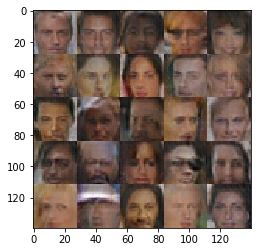

Epoch 2/4... Discriminator Loss: 1.3060... Generator Loss: 0.8018
Epoch 2/4... Discriminator Loss: 1.3858... Generator Loss: 0.7973


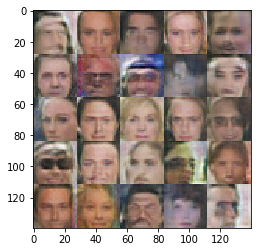

Epoch 2/4... Discriminator Loss: 1.3536... Generator Loss: 0.6595
Epoch 2/4... Discriminator Loss: 1.4085... Generator Loss: 0.6528


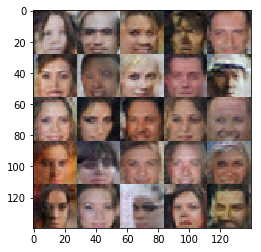

Epoch 3/4... Discriminator Loss: 1.3095... Generator Loss: 0.7282
Epoch 3/4... Discriminator Loss: 1.3995... Generator Loss: 0.6630


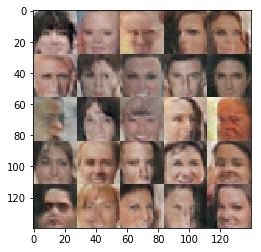

Epoch 3/4... Discriminator Loss: 1.4455... Generator Loss: 0.7094
Epoch 3/4... Discriminator Loss: 1.4258... Generator Loss: 0.6762


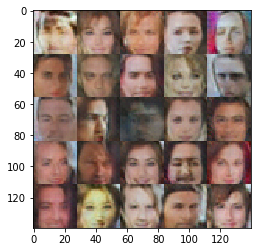

Epoch 3/4... Discriminator Loss: 1.4403... Generator Loss: 0.6496
Epoch 3/4... Discriminator Loss: 1.4709... Generator Loss: 0.7769


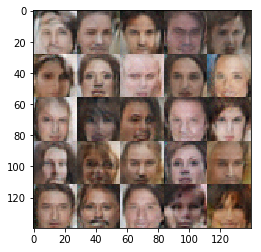

Epoch 3/4... Discriminator Loss: 1.2538... Generator Loss: 0.7699
Epoch 3/4... Discriminator Loss: 1.3499... Generator Loss: 0.6823


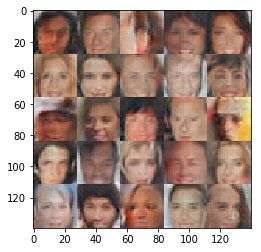

Epoch 3/4... Discriminator Loss: 1.4385... Generator Loss: 0.6785
Epoch 3/4... Discriminator Loss: 1.3869... Generator Loss: 0.7107


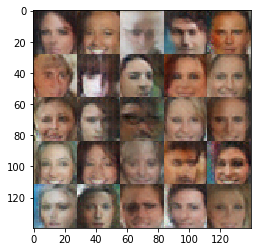

Epoch 3/4... Discriminator Loss: 1.4452... Generator Loss: 0.7639
Epoch 3/4... Discriminator Loss: 1.2914... Generator Loss: 0.8612


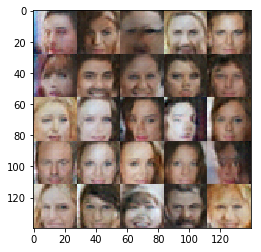

Epoch 3/4... Discriminator Loss: 1.2323... Generator Loss: 0.9592
Epoch 3/4... Discriminator Loss: 1.2707... Generator Loss: 0.8123


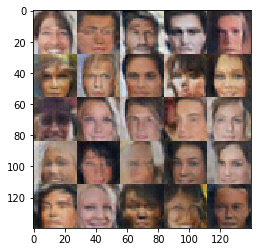

Epoch 3/4... Discriminator Loss: 1.2961... Generator Loss: 0.8412
Epoch 3/4... Discriminator Loss: 1.2956... Generator Loss: 0.8257


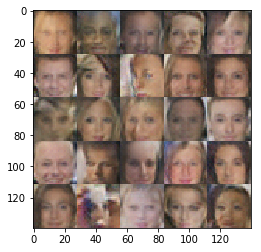

Epoch 3/4... Discriminator Loss: 1.3707... Generator Loss: 0.6939
Epoch 3/4... Discriminator Loss: 1.4344... Generator Loss: 0.6373


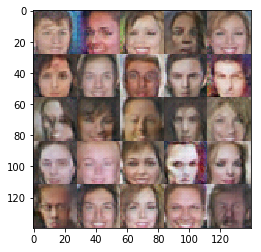

Epoch 3/4... Discriminator Loss: 1.3432... Generator Loss: 0.7290
Epoch 3/4... Discriminator Loss: 1.3870... Generator Loss: 0.6401


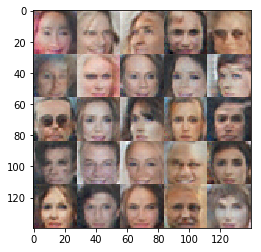

Epoch 3/4... Discriminator Loss: 1.3846... Generator Loss: 0.6910
Epoch 3/4... Discriminator Loss: 1.3657... Generator Loss: 0.7805


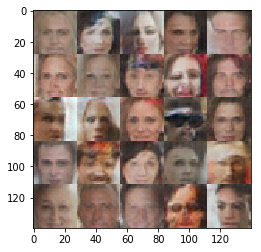

Epoch 3/4... Discriminator Loss: 1.2349... Generator Loss: 0.9629
Epoch 3/4... Discriminator Loss: 1.2719... Generator Loss: 0.7791


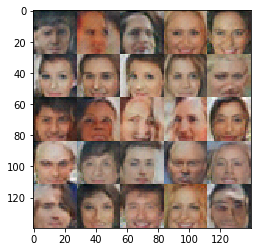

Epoch 3/4... Discriminator Loss: 1.3792... Generator Loss: 0.7408
Epoch 3/4... Discriminator Loss: 1.3038... Generator Loss: 0.7597


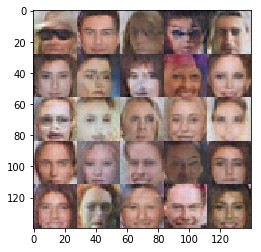

Epoch 3/4... Discriminator Loss: 1.4471... Generator Loss: 0.6270
Epoch 3/4... Discriminator Loss: 1.3607... Generator Loss: 0.6200


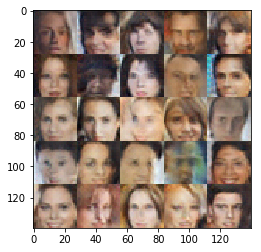

Epoch 3/4... Discriminator Loss: 1.3380... Generator Loss: 0.8978
Epoch 3/4... Discriminator Loss: 1.3541... Generator Loss: 0.7014


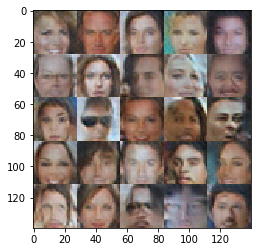

Epoch 3/4... Discriminator Loss: 1.4349... Generator Loss: 0.8319
Epoch 3/4... Discriminator Loss: 1.4636... Generator Loss: 0.7624


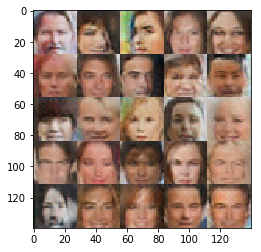

Epoch 3/4... Discriminator Loss: 1.2907... Generator Loss: 0.8673
Epoch 3/4... Discriminator Loss: 1.3260... Generator Loss: 0.7367


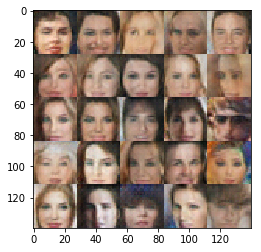

Epoch 3/4... Discriminator Loss: 1.4739... Generator Loss: 0.6597
Epoch 3/4... Discriminator Loss: 1.2856... Generator Loss: 0.7845


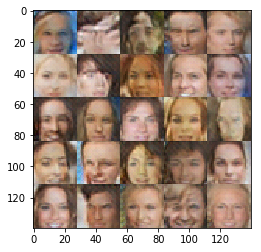

Epoch 3/4... Discriminator Loss: 1.3791... Generator Loss: 0.6750
Epoch 3/4... Discriminator Loss: 1.3629... Generator Loss: 0.8708


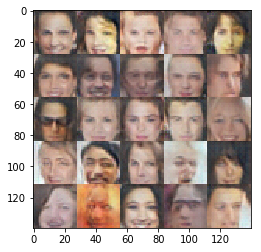

Epoch 3/4... Discriminator Loss: 1.2904... Generator Loss: 0.8404
Epoch 3/4... Discriminator Loss: 1.4145... Generator Loss: 0.7779


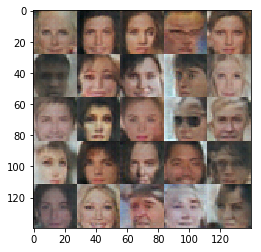

Epoch 3/4... Discriminator Loss: 1.3942... Generator Loss: 0.5737
Epoch 3/4... Discriminator Loss: 1.3569... Generator Loss: 0.6409


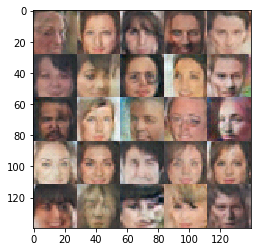

Epoch 3/4... Discriminator Loss: 1.5264... Generator Loss: 0.5645
Epoch 3/4... Discriminator Loss: 1.4344... Generator Loss: 0.5674


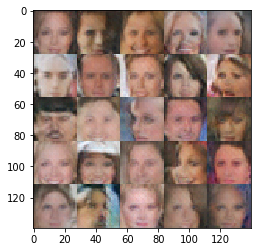

Epoch 3/4... Discriminator Loss: 1.4222... Generator Loss: 0.8881
Epoch 3/4... Discriminator Loss: 1.3974... Generator Loss: 0.7661


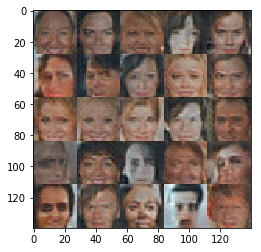

Epoch 3/4... Discriminator Loss: 1.4994... Generator Loss: 0.5748
Epoch 3/4... Discriminator Loss: 1.4240... Generator Loss: 0.6688


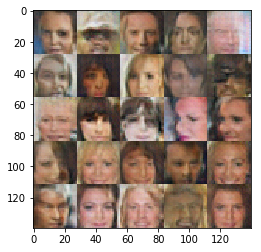

Epoch 3/4... Discriminator Loss: 1.2910... Generator Loss: 0.8506
Epoch 3/4... Discriminator Loss: 1.4683... Generator Loss: 0.6831


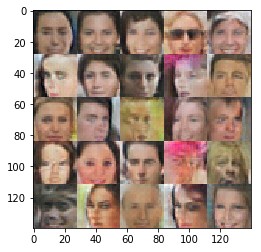

Epoch 3/4... Discriminator Loss: 1.3544... Generator Loss: 0.7398
Epoch 3/4... Discriminator Loss: 1.3611... Generator Loss: 0.7133


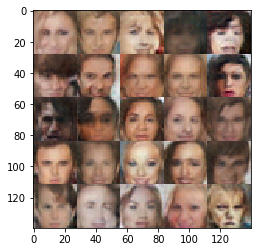

Epoch 3/4... Discriminator Loss: 1.2402... Generator Loss: 0.9200
Epoch 3/4... Discriminator Loss: 1.3200... Generator Loss: 0.7893


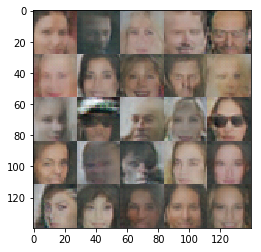

Epoch 3/4... Discriminator Loss: 1.3655... Generator Loss: 0.6556
Epoch 3/4... Discriminator Loss: 1.3022... Generator Loss: 0.7698


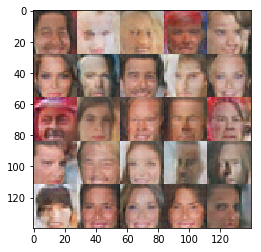

Epoch 3/4... Discriminator Loss: 1.3986... Generator Loss: 0.6732
Epoch 3/4... Discriminator Loss: 1.3435... Generator Loss: 0.7901


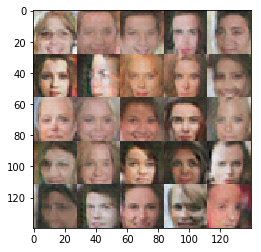

Epoch 3/4... Discriminator Loss: 1.3365... Generator Loss: 0.6744
Epoch 3/4... Discriminator Loss: 1.2642... Generator Loss: 0.8227


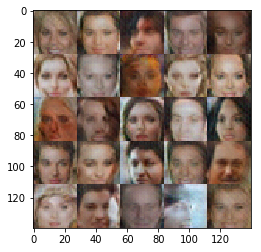

Epoch 3/4... Discriminator Loss: 1.2872... Generator Loss: 0.7755
Epoch 3/4... Discriminator Loss: 1.3714... Generator Loss: 0.6926


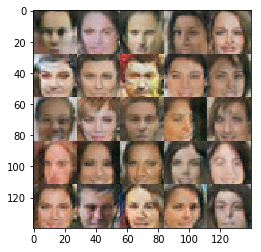

Epoch 3/4... Discriminator Loss: 1.4502... Generator Loss: 0.6104
Epoch 3/4... Discriminator Loss: 1.3848... Generator Loss: 0.6754


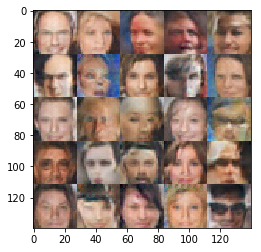

Epoch 3/4... Discriminator Loss: 1.3814... Generator Loss: 0.8150
Epoch 3/4... Discriminator Loss: 1.3202... Generator Loss: 0.7973


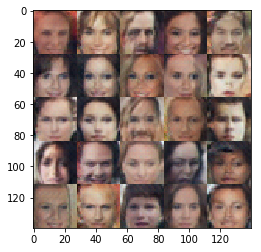

Epoch 3/4... Discriminator Loss: 1.3556... Generator Loss: 0.7118
Epoch 3/4... Discriminator Loss: 1.4294... Generator Loss: 0.6028


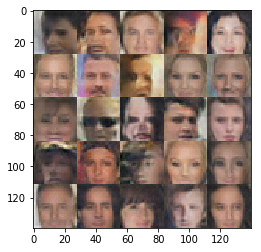

Epoch 3/4... Discriminator Loss: 1.3759... Generator Loss: 0.6552
Epoch 3/4... Discriminator Loss: 1.4033... Generator Loss: 0.7648


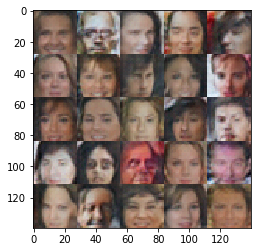

Epoch 3/4... Discriminator Loss: 1.3945... Generator Loss: 0.9575
Epoch 3/4... Discriminator Loss: 1.3127... Generator Loss: 0.8047


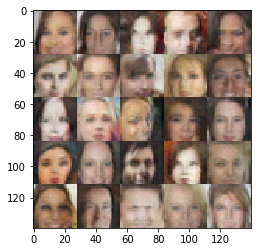

Epoch 3/4... Discriminator Loss: 1.3918... Generator Loss: 0.7251
Epoch 3/4... Discriminator Loss: 1.3375... Generator Loss: 0.8175


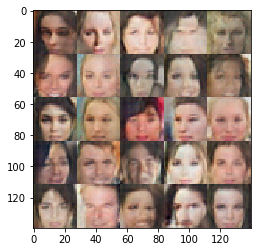

Epoch 3/4... Discriminator Loss: 1.3844... Generator Loss: 0.8189
Epoch 3/4... Discriminator Loss: 1.2795... Generator Loss: 0.7806


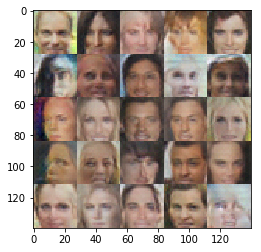

Epoch 3/4... Discriminator Loss: 1.4180... Generator Loss: 0.6790
Epoch 3/4... Discriminator Loss: 1.3078... Generator Loss: 0.8878


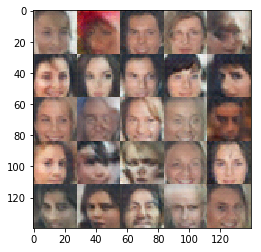

Epoch 3/4... Discriminator Loss: 1.3010... Generator Loss: 0.8085
Epoch 3/4... Discriminator Loss: 1.3254... Generator Loss: 0.7718


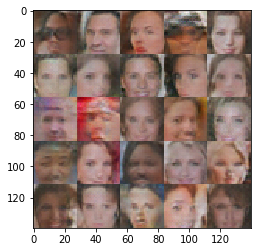

Epoch 3/4... Discriminator Loss: 1.3483... Generator Loss: 0.7281
Epoch 3/4... Discriminator Loss: 1.3181... Generator Loss: 0.9988


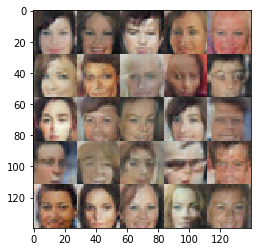

Epoch 3/4... Discriminator Loss: 1.2304... Generator Loss: 0.7446
Epoch 3/4... Discriminator Loss: 1.2986... Generator Loss: 0.7116


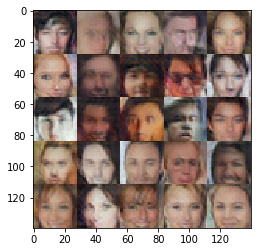

Epoch 3/4... Discriminator Loss: 1.3826... Generator Loss: 0.7199
Epoch 3/4... Discriminator Loss: 1.3667... Generator Loss: 0.8271


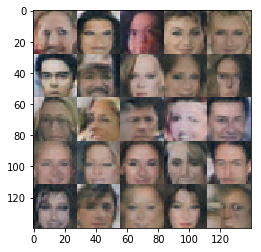

Epoch 3/4... Discriminator Loss: 1.4451... Generator Loss: 0.5951
Epoch 3/4... Discriminator Loss: 1.3485... Generator Loss: 0.7270


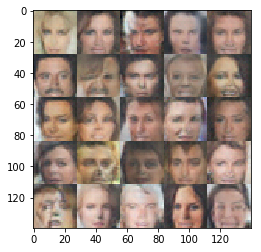

Epoch 3/4... Discriminator Loss: 1.2478... Generator Loss: 0.9478
Epoch 3/4... Discriminator Loss: 1.4124... Generator Loss: 0.6750


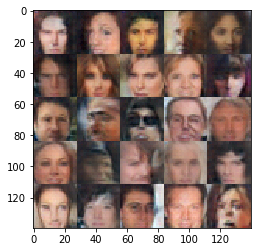

Epoch 3/4... Discriminator Loss: 1.2977... Generator Loss: 0.9088
Epoch 3/4... Discriminator Loss: 1.2461... Generator Loss: 0.9146


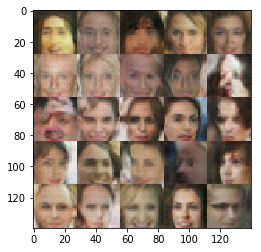

Epoch 3/4... Discriminator Loss: 1.4603... Generator Loss: 0.7641
Epoch 3/4... Discriminator Loss: 1.3832... Generator Loss: 0.7345


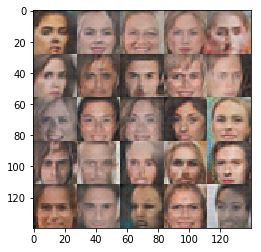

Epoch 3/4... Discriminator Loss: 1.3248... Generator Loss: 0.7544
Epoch 3/4... Discriminator Loss: 1.2307... Generator Loss: 0.8066


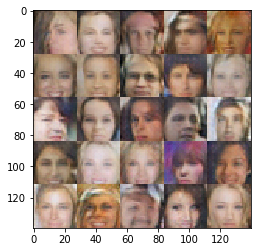

Epoch 3/4... Discriminator Loss: 1.3608... Generator Loss: 0.7383
Epoch 3/4... Discriminator Loss: 1.5163... Generator Loss: 0.6622


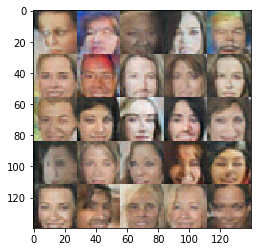

Epoch 4/4... Discriminator Loss: 1.3050... Generator Loss: 0.7883
Epoch 4/4... Discriminator Loss: 1.3580... Generator Loss: 0.7016


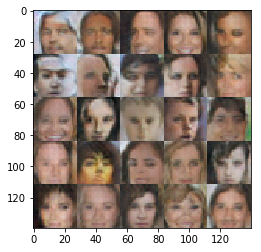

Epoch 4/4... Discriminator Loss: 1.3548... Generator Loss: 0.8995
Epoch 4/4... Discriminator Loss: 1.3755... Generator Loss: 0.7600


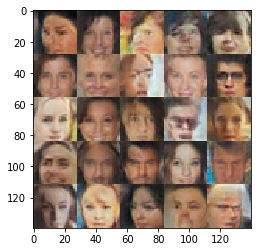

Epoch 4/4... Discriminator Loss: 1.2663... Generator Loss: 0.7997
Epoch 4/4... Discriminator Loss: 1.3603... Generator Loss: 0.7647


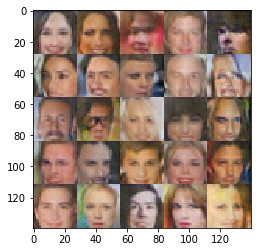

Epoch 4/4... Discriminator Loss: 1.2918... Generator Loss: 0.8551
Epoch 4/4... Discriminator Loss: 1.5101... Generator Loss: 0.6602


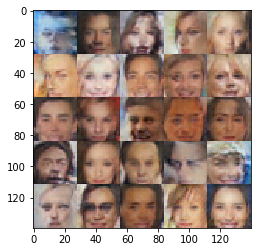

Epoch 4/4... Discriminator Loss: 1.1914... Generator Loss: 0.8610
Epoch 4/4... Discriminator Loss: 1.5143... Generator Loss: 0.7102


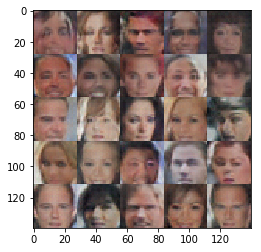

Epoch 4/4... Discriminator Loss: 1.2983... Generator Loss: 0.8122
Epoch 4/4... Discriminator Loss: 1.3900... Generator Loss: 0.7110


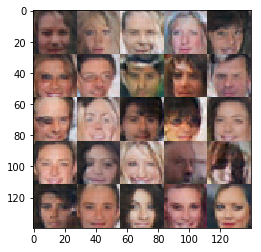

Epoch 4/4... Discriminator Loss: 1.3234... Generator Loss: 0.7668
Epoch 4/4... Discriminator Loss: 1.4285... Generator Loss: 0.7497


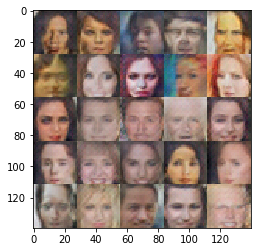

Epoch 4/4... Discriminator Loss: 1.3138... Generator Loss: 0.6658
Epoch 4/4... Discriminator Loss: 1.4269... Generator Loss: 0.8690


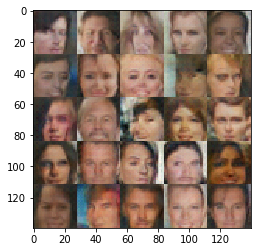

Epoch 4/4... Discriminator Loss: 1.3888... Generator Loss: 0.6649
Epoch 4/4... Discriminator Loss: 1.2634... Generator Loss: 0.9056


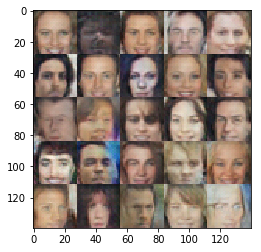

Epoch 4/4... Discriminator Loss: 1.2386... Generator Loss: 0.8271
Epoch 4/4... Discriminator Loss: 1.4854... Generator Loss: 0.5500


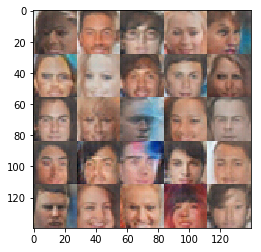

Epoch 4/4... Discriminator Loss: 1.3140... Generator Loss: 0.7873
Epoch 4/4... Discriminator Loss: 1.4180... Generator Loss: 0.7635


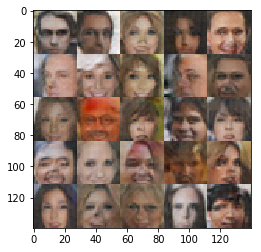

Epoch 4/4... Discriminator Loss: 1.2699... Generator Loss: 0.8831
Epoch 4/4... Discriminator Loss: 1.3172... Generator Loss: 0.8160


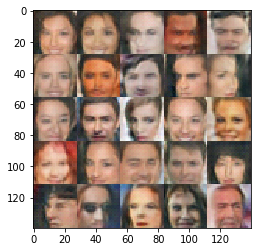

Epoch 4/4... Discriminator Loss: 1.2839... Generator Loss: 0.7664
Epoch 4/4... Discriminator Loss: 1.3092... Generator Loss: 0.8229


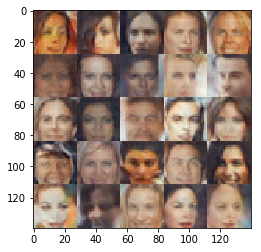

Epoch 4/4... Discriminator Loss: 1.3621... Generator Loss: 0.6655
Epoch 4/4... Discriminator Loss: 1.4217... Generator Loss: 0.6657


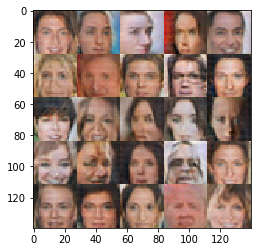

Epoch 4/4... Discriminator Loss: 1.3193... Generator Loss: 0.6904
Epoch 4/4... Discriminator Loss: 1.2746... Generator Loss: 0.7700


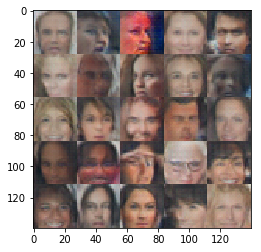

Epoch 4/4... Discriminator Loss: 1.3082... Generator Loss: 0.7776
Epoch 4/4... Discriminator Loss: 1.2556... Generator Loss: 0.8723


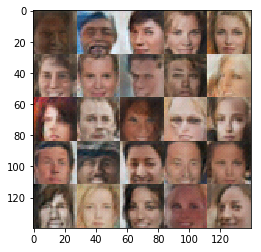

Epoch 4/4... Discriminator Loss: 1.2614... Generator Loss: 0.8191
Epoch 4/4... Discriminator Loss: 1.2873... Generator Loss: 0.8959


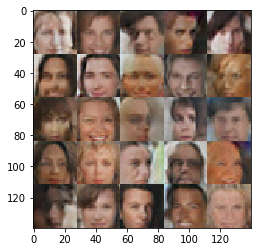

Epoch 4/4... Discriminator Loss: 1.3462... Generator Loss: 0.7033
Epoch 4/4... Discriminator Loss: 1.3071... Generator Loss: 0.8020


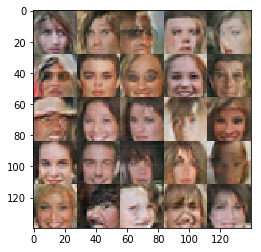

Epoch 4/4... Discriminator Loss: 1.3944... Generator Loss: 0.6981
Epoch 4/4... Discriminator Loss: 1.4062... Generator Loss: 0.6165


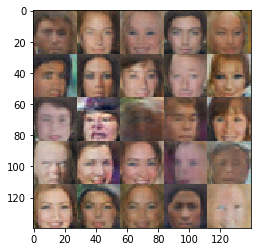

Epoch 4/4... Discriminator Loss: 1.3272... Generator Loss: 0.8185
Epoch 4/4... Discriminator Loss: 1.4036... Generator Loss: 0.6954


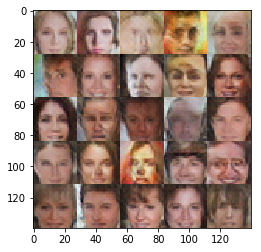

Epoch 4/4... Discriminator Loss: 1.2579... Generator Loss: 0.8224
Epoch 4/4... Discriminator Loss: 1.3159... Generator Loss: 0.7475


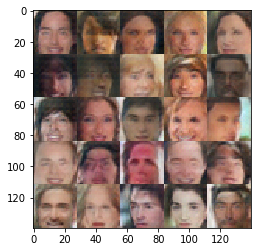

Epoch 4/4... Discriminator Loss: 1.3772... Generator Loss: 0.7387
Epoch 4/4... Discriminator Loss: 1.3834... Generator Loss: 0.7251


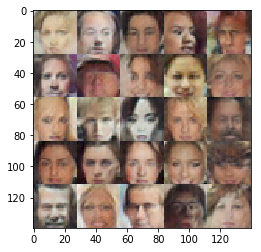

Epoch 4/4... Discriminator Loss: 1.3341... Generator Loss: 0.7266
Epoch 4/4... Discriminator Loss: 1.3336... Generator Loss: 0.7519


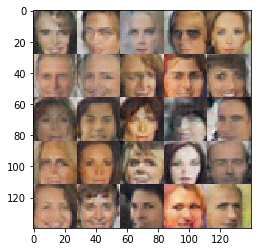

Epoch 4/4... Discriminator Loss: 1.3500... Generator Loss: 0.8191
Epoch 4/4... Discriminator Loss: 1.3769... Generator Loss: 0.7775


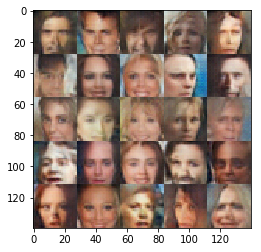

Epoch 4/4... Discriminator Loss: 1.3429... Generator Loss: 0.7312
Epoch 4/4... Discriminator Loss: 1.4009... Generator Loss: 0.8680


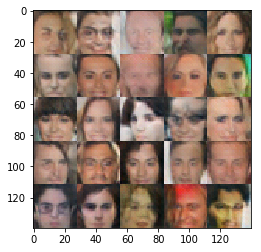

Epoch 4/4... Discriminator Loss: 1.3078... Generator Loss: 0.7783
Epoch 4/4... Discriminator Loss: 1.3456... Generator Loss: 0.8083


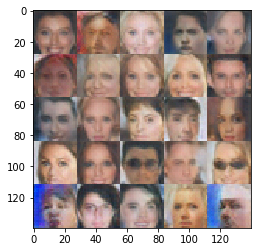

Epoch 4/4... Discriminator Loss: 1.3705... Generator Loss: 0.7294
Epoch 4/4... Discriminator Loss: 1.2773... Generator Loss: 0.9039


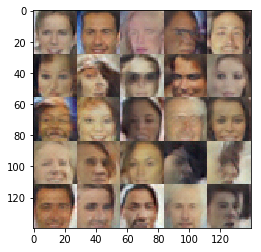

Epoch 4/4... Discriminator Loss: 1.2745... Generator Loss: 0.9095
Epoch 4/4... Discriminator Loss: 1.4188... Generator Loss: 0.7129


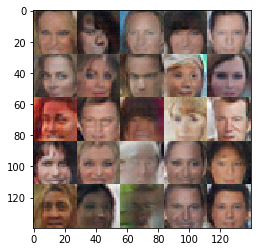

Epoch 4/4... Discriminator Loss: 1.3132... Generator Loss: 0.8390
Epoch 4/4... Discriminator Loss: 1.3483... Generator Loss: 0.7204


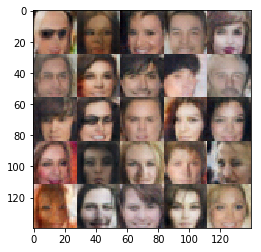

Epoch 4/4... Discriminator Loss: 1.4740... Generator Loss: 0.6683
Epoch 4/4... Discriminator Loss: 1.2260... Generator Loss: 0.9523


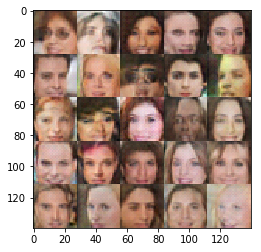

Epoch 4/4... Discriminator Loss: 1.4078... Generator Loss: 0.5958
Epoch 4/4... Discriminator Loss: 1.4277... Generator Loss: 0.6117


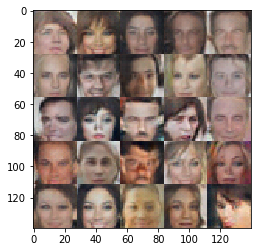

Epoch 4/4... Discriminator Loss: 1.2697... Generator Loss: 0.8337
Epoch 4/4... Discriminator Loss: 1.3130... Generator Loss: 0.8106


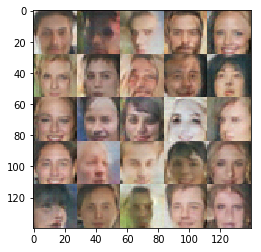

Epoch 4/4... Discriminator Loss: 1.3509... Generator Loss: 0.6854
Epoch 4/4... Discriminator Loss: 1.3745... Generator Loss: 0.6843


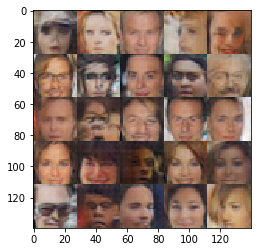

Epoch 4/4... Discriminator Loss: 1.3797... Generator Loss: 0.6459
Epoch 4/4... Discriminator Loss: 1.3649... Generator Loss: 0.6622


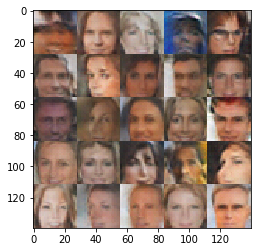

Epoch 4/4... Discriminator Loss: 1.4686... Generator Loss: 0.6343
Epoch 4/4... Discriminator Loss: 1.4377... Generator Loss: 0.5920


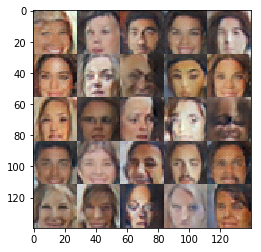

Epoch 4/4... Discriminator Loss: 1.3892... Generator Loss: 0.6643
Epoch 4/4... Discriminator Loss: 1.4859... Generator Loss: 0.6016


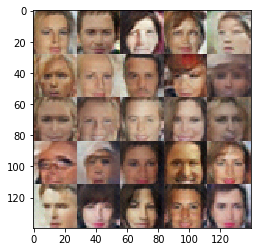

Epoch 4/4... Discriminator Loss: 1.4267... Generator Loss: 0.5971
Epoch 4/4... Discriminator Loss: 1.3921... Generator Loss: 0.7003


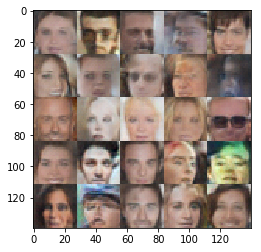

Epoch 4/4... Discriminator Loss: 1.3523... Generator Loss: 0.7898
Epoch 4/4... Discriminator Loss: 1.3677... Generator Loss: 0.6790


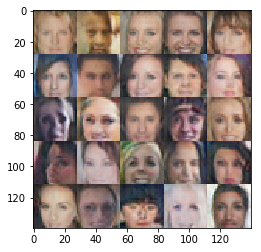

Epoch 4/4... Discriminator Loss: 1.3142... Generator Loss: 0.7899
Epoch 4/4... Discriminator Loss: 1.2728... Generator Loss: 0.7724


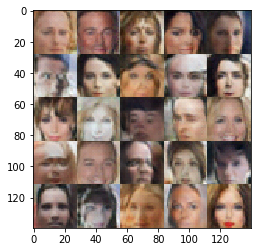

Epoch 4/4... Discriminator Loss: 1.3989... Generator Loss: 0.6654
Epoch 4/4... Discriminator Loss: 1.2820... Generator Loss: 0.8033


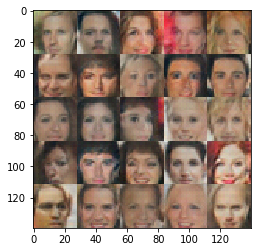

Epoch 4/4... Discriminator Loss: 1.4408... Generator Loss: 0.6561
Epoch 4/4... Discriminator Loss: 1.2404... Generator Loss: 0.8750


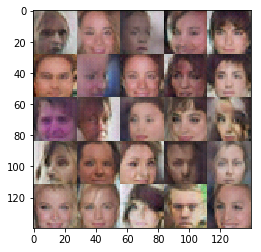

Epoch 4/4... Discriminator Loss: 1.3022... Generator Loss: 0.8287
Epoch 4/4... Discriminator Loss: 1.3626... Generator Loss: 0.6751


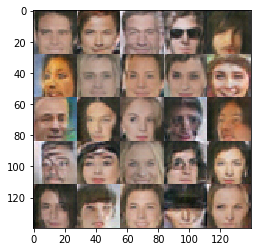

Epoch 4/4... Discriminator Loss: 1.2305... Generator Loss: 0.8090
Epoch 4/4... Discriminator Loss: 1.3669... Generator Loss: 0.6718


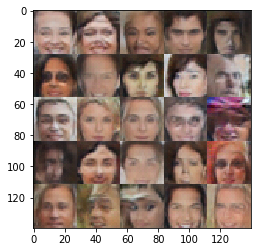

Epoch 4/4... Discriminator Loss: 1.1730... Generator Loss: 0.9143
Epoch 4/4... Discriminator Loss: 1.3644... Generator Loss: 0.6964


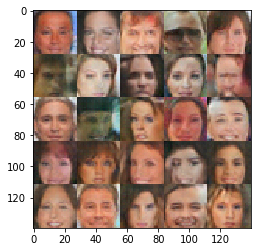

Epoch 4/4... Discriminator Loss: 1.3549... Generator Loss: 0.7560
Epoch 4/4... Discriminator Loss: 1.4622... Generator Loss: 0.6416


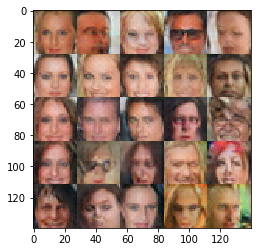

Epoch 4/4... Discriminator Loss: 1.3517... Generator Loss: 0.6596
Epoch 4/4... Discriminator Loss: 1.4418... Generator Loss: 0.7173


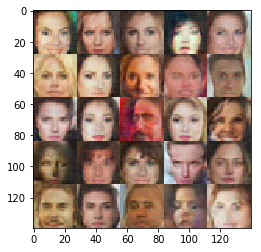

Epoch 4/4... Discriminator Loss: 1.4276... Generator Loss: 0.6743
Epoch 4/4... Discriminator Loss: 1.4442... Generator Loss: 0.6418


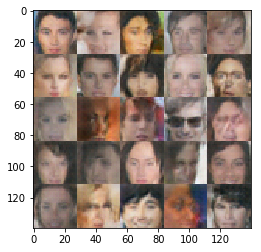

Epoch 4/4... Discriminator Loss: 1.2239... Generator Loss: 0.9843
Epoch 4/4... Discriminator Loss: 1.4123... Generator Loss: 0.6489


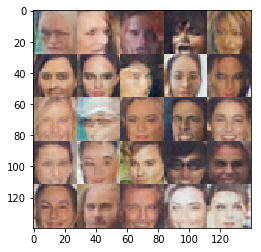

Epoch 4/4... Discriminator Loss: 1.3339... Generator Loss: 0.6044
Epoch 4/4... Discriminator Loss: 1.3185... Generator Loss: 0.7283


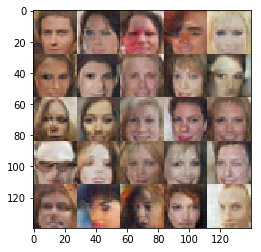

In [21]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.